In [ ]:
#mounting drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#unzipping 
!unzip /content/drive/MyDrive/BRAIN_MRI/archive.zip

Streaming output truncated to the last 5000 lines.
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7294_19890104/TCGA_DU_7294_19890104_9_mask.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_1.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_10.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_10_mask.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_11.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_11_mask.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_12.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_12_mask.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_13.tif  
  inflating: lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_1

In [ ]:
#importing libraries
import os,shutil
import pandas as pd
import numpy as np
import seaborn as sns
from osgeo import gdal
import matplotlib.pyplot as plt
from tqdm import tqdm

In [ ]:
#list of all the folders inside kaggle_3m folder excluding 'data.csv' and 'README.md'
folders=list(filter(lambda x: x not in ['data.csv','README.md'], os.listdir("/content/kaggle_3m/") ))

In [ ]:
#total number of folders
len(folders)

110

In [ ]:
#collecting all the images from all the 110 folders into scan and mask folders
try:
  os.mkdir("/content/scan/")
  os.mkdir("/content/mask/")
except:
  shutil.rmtree("scan/")
  shutil.rmtree("mask/")
  os.mkdir("/content/scan/")
  os.mkdir("/content/mask/")
####################################################################
for file in tqdm(folders):
  for image in os.listdir("/content/kaggle_3m/"+file):
    if "mask" not in image:
      shutil.copy("/content/kaggle_3m/"+file+"/"+image , "/content/scan/"+image)
    else:
      shutil.copy("/content/kaggle_3m/"+file+"/"+image , "/content/mask/"+image)

100%|██████████| 110/110 [00:03<00:00, 29.38it/s]


In [ ]:
#total number of scan and mask images
len( os.listdir("/content/mask/")),len( os.listdir("/content/scan/"))

(3929, 3929)

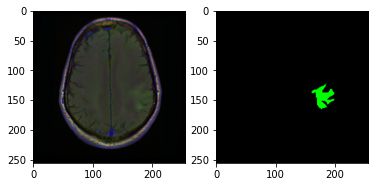

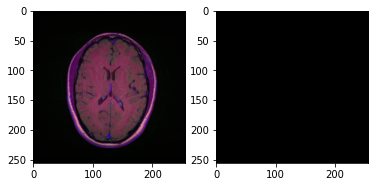

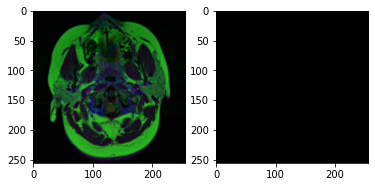

In [ ]:
#plotting some sample raw scans and mask images
from osgeo import gdal
import matplotlib.pyplot as plt
for i in os.listdir("/content/scan/")[:3]:
  ##############################################################
  fig, axs = plt.subplots(1, 2)
  dataset = gdal.Open(r'/content/scan/'+i)
  img = np.dstack((dataset.GetRasterBand(1).ReadAsArray(), dataset.GetRasterBand(2).ReadAsArray(), dataset.GetRasterBand(3).ReadAsArray()))
  axs[0].imshow(img)
  dataset = gdal.Open(r'/content/mask/'+i.split(".tif")[0]+"_mask.tif")
  img = np.dstack((np.zeros_like(dataset.GetRasterBand(1).ReadAsArray()), dataset.GetRasterBand(1).ReadAsArray(), np.zeros_like(dataset.GetRasterBand(1).ReadAsArray())))
  axs[1].imshow(img)
  plt.show()

In [ ]:
#creating 2 class to know whether the scan image has any abnormality or not
from osgeo import gdal
import matplotlib.pyplot as plt
labels=[]
for i in os.listdir("/content/scan/"):
  scan_path="scan/"+i
  mask_path ="mask/"+i.split(".")[0]+"_mask.tif"
  mask_d = gdal.Open(mask_path)
  scan_d = gdal.Open(scan_path)
  if (mask_d.GetRasterBand(1).ReadAsArray()==np.zeros_like(mask_d.GetRasterBand(1).ReadAsArray())).all():
    labels.append("Normal")
  else:
    labels.append("Abnormality")

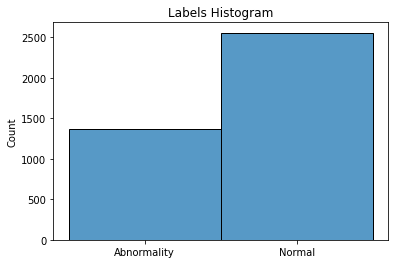

In [ ]:
#Plotting histogram of new introduced classes to know the imbalancing
sns.histplot(labels)
plt.title("Labels Histogram")
plt.show()

In [ ]:
#exact count of new introduced classes
print("Normal ", labels.count("Normal") )
print("Abnormality ", labels.count("Abnormality") )

Normal  2556
Abnormality  1373


In [ ]:
#collecting all the labels, scan image path and thier correspoding mask images path into the list 
scans=list( map( lambda x: x, os.listdir( "/content/scan/" ) ) )
SCAN_IMAGES_PATH=[]
MASK_IMAGES_PATH=[]
LABELS=[]
for s in tqdm(scans):
  scan_path="scan/"+s
  mask_path ="mask/"+s.split(".")[0]+"_mask.tif"
  mask_d = gdal.Open(mask_path)
  scan_d = gdal.Open(scan_path)
  if (mask_d.GetRasterBand(1).ReadAsArray()==np.zeros_like(mask_d.GetRasterBand(1).ReadAsArray())).all(): lab=0
  else: lab=1
  SCAN_IMAGES_PATH.append(scan_path)
  MASK_IMAGES_PATH.append(mask_path)
  LABELS.append(lab)


100%|██████████| 3929/3929 [00:01<00:00, 3157.36it/s]


In [ ]:
#creating dataframe from all the collected path and labels in the previous step
df=pd.DataFrame()
df["image"]=SCAN_IMAGES_PATH
df["mask"]=MASK_IMAGES_PATH
df["LABELS"]=LABELS
df

,image,mask,LABELS
0,scan/TCGA_HT_8107_19980708_14.tif,mask/TCGA_HT_8107_19980708_14_mask.tif,1
1,scan/TCGA_HT_7881_19981015_45.tif,mask/TCGA_HT_7881_19981015_45_mask.tif,0
2,scan/TCGA_FG_8189_20030516_6.tif,mask/TCGA_FG_8189_20030516_6_mask.tif,0
3,scan/TCGA_HT_A61B_19991127_33.tif,mask/TCGA_HT_A61B_19991127_33_mask.tif,1
4,scan/TCGA_EZ_7264_20010816_17.tif,mask/TCGA_EZ_7264_20010816_17_mask.tif,1
...,...,...,...
3924,scan/TCGA_HT_7690_19960312_4.tif,mask/TCGA_HT_7690_19960312_4_mask.tif,0
3925,scan/TCGA_HT_7874_19950902_5.tif,mask/TCGA_HT_7874_19950902_5_mask.tif,0
3926,scan/TCGA_FG_8189_20030516_58.tif,mask/TCGA_FG_8189_20030516_58_mask.tif,0
3927,scan/TCGA_DU_5854_19951104_34.tif,mask/TCGA_DU_5854_19951104_34_mask.tif,0


In [ ]:
#labels count
df["LABELS"].value_counts()

0    2556
1    1373
Name: LABELS, dtype: int64

In [ ]:
#randomly stratified spliting into train and test datset in the ratio of 7:3
from sklearn.model_selection import train_test_split
X_train, X_test = train_test_split(df, test_size=0.3, random_state=42, stratify=df["LABELS"])

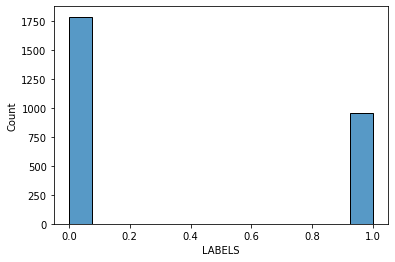

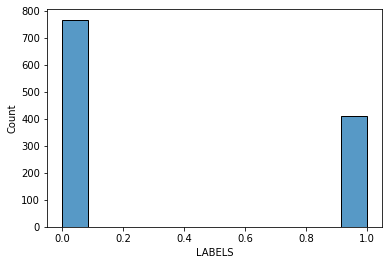

In [ ]:
#Train and Test label distribution
sns.histplot(X_train["LABELS"])
plt.show()
sns.histplot(X_test["LABELS"])
plt.show()

In [ ]:
#installing tensorflow==2.2.0, keras==2.3.1
!pip install tensorflow==2.2.0
!pip install keras==2.3.1

     |████████████████████████████████| 516.2 MB 4.4 kB/s 
     |████████████████████████████████| 454 kB 48.9 MB/s 
     |████████████████████████████████| 2.9 MB 46.0 MB/s 
     |████████████████████████████████| 3.0 MB 21.6 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.7.0
    Uninstalling tensorflow-estimator-2.7.0:
      Successfully uninstalled tensorflow-estimator-2.7.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.7.0
    Uninstalling tensorboard-2.7.0:
      Successfully uninstalled tensorboard-2.7.0
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0
  Attempting uninstall: gast
    Found existing installation: gast 0.4.0
    Uninstalling gast-0.4.0:
      Successfully uninstalled gast-0.4.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.7.0
    Uninstalli

In [ ]:
#installing segmentation_models
!pip install git+https://github.com/qubvel/segmentation_models

  Cloning https://github.com/qubvel/segmentation_models to /tmp/pip-req-build-4kndox0l
  Running command git clone -q https://github.com/qubvel/segmentation_models /tmp/pip-req-build-4kndox0l
  Running command git submodule update --init --recursive -q
  Created wheel for segmentation-models: filename=segmentation_models-1.0.1-py3-none-any.whl size=33810 sha256=ca6c39207b64c38809287730d5d9cc16b113219c54bd902a336c203277b5670b
  Stored in directory: /tmp/pip-ephem-wheel-cache-znrgd0l7/wheels/02/cd/18/61c0bbb8766acfec68f9d20618886b7b38dfeeb95865b6ba00
Successfully built segmentation-models


In [ ]:
#importing some libraries 
#using keras framework in backend 
import keras
# SM_FRAMEWORK=keras
import segmentation_models as sm
from segmentation_models import Unet
sm.set_framework('keras')
keras.backend.set_image_data_format('channels_last')

Using TensorFlow backend.


Segmentation Models: using `keras` framework.


In [ ]:
#using Unet architecture with backbone name resnet50 and input shape 256,256,3 also not training encoder weights
model = Unet('resnet50', encoder_weights='imagenet', classes=2, activation='softmax', input_shape=(256,256,3),encoder_freeze=True)
#model summary
model.summary()

94593024/94592056 [==============================] - 2s 0us/step
Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
data (InputLayer)               (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
bn_data (BatchNormalization)    (None, 256, 256, 3)  9           data[0][0]                       
__________________________________________________________________________________________________
zero_padding2d_1 (ZeroPadding2D (None, 262, 262, 3)  0           bn_data[0][0]                    
__________________________________________________________________________________________________
conv0 (Conv2D)                  (None, 128, 128, 64) 9408        zero_padding2d_1[0][0]           
___________________________

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
#traing data augmentation parameter
train_gen_aug = dict(rotation_range=0.2,
                        width_shift_range=0.05,
                        height_shift_range=0.05,
                        shear_range=0.05,
                        zoom_range=0.05,
                        horizontal_flip=True,
                        fill_mode='nearest')

In [ ]:
#https://www.kaggle.com/saivikassingamsetty/mea-unet-cbam-median-14-12
#adjustment into the image
def adjust(img,mask):
    #normalization
    img = img / 255.

    #mask
    mask = mask / 255.
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0

    return (img, mask)

In [ ]:
#https://www.kaggle.com/saivikassingamsetty/mea-unet-cbam-median-14-12
#data generator 
def train_generator(dataframe, batch_size, aug_dict, 
                    image_color_mode = "rgb",
                    mask_color_mode = "grayscale",
                    image_save_prefix = "image",
                    mask_save_prefix = "mask",
                    save_to_dir = None,
                    target_size = (256,256),
                    seed = 1):
    image_datagen = ImageDataGenerator(**aug_dict)
    mask_datagen = ImageDataGenerator(**aug_dict)

  #image
    image_generator = image_datagen.flow_from_dataframe(
          dataframe,
          x_col = "image",
          target_size = target_size,
          batch_size = batch_size,
          class_mode = None,
          color_mode = image_color_mode,
          save_to_dir = save_to_dir,
          save_prefix = image_save_prefix,
          seed = seed )

      #mask
    mask_generator = mask_datagen.flow_from_dataframe(
          dataframe,
          x_col = "mask",
          target_size = target_size,
          batch_size = batch_size,
          class_mode = None,
          color_mode = mask_color_mode,
          save_to_dir = save_to_dir,
          save_prefix = mask_save_prefix,
          seed = seed)
  
  #combining the generators to make a whole generator
    train_gen = zip(image_generator, mask_generator)

  #data adjustment
    for (img, mask) in train_gen:
        img, mask = adjust(img, mask)
        yield (img,mask)

In [ ]:
BATCH_SIZE=20
train_gen = train_generator(X_train, batch_size= BATCH_SIZE, aug_dict = train_gen_aug)
test_gen = train_generator(X_test, batch_size = BATCH_SIZE, aug_dict = dict())

In [ ]:
from segmentation_models.metrics import iou_score
from segmentation_models import Unet
model.compile(keras.optimizers.Adam(0.001) , sm.losses.cce_dice_loss, metrics=[sm.metrics.IOUScore(threshold=0.5)])

In [ ]:
import datetime
from keras.callbacks import ModelCheckpoint,ReduceLROnPlateau
log_dir="/content/drive/MyDrive/BRAIN_MRI/logs/fit"  + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

In [ ]:
# defining callbacks
###########################################################################################################################################
tensorboard_callback=keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1)
###########################################################################################################################################
lr_reducer=keras.callbacks.ReduceLROnPlateau(monitor='val_iou_score', min_lr=0.000001,patience=2,factor=0.9)
###########################################################################################################################################
chackpoint=keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/BRAIN_MRI/unetmodel.h5',monitor='val_iou_score')
###########################################################################################################################################
callbacks = [tensorboard_callback, chackpoint,lr_reducer]

In [ ]:
#model training
model.fit_generator(train_gen, steps_per_epoch=len(X_train)//BATCH_SIZE, epochs=20,validation_data=test_gen, callbacks=callbacks,validation_steps= len(X_train)//BATCH_SIZE)

Epoch 1/20
Found 1179 validated image filenames.
Found 1179 validated image filenames.
Found 2750 validated image filenames.
Found 2750 validated image filenames.
137/137 [==============================] - 381s 3s/step - loss: 0.8042 - iou_score: 0.1663 - val_loss: 1.0226 - val_iou_score: 0.0050
Epoch 2/20
137/137 [==============================] - 350s 3s/step - loss: 0.6731 - iou_score: 0.2826 - val_loss: 1.0478 - val_iou_score: 0.0050
Epoch 3/20
137/137 [==============================] - 345s 3s/step - loss: 0.6483 - iou_score: 0.3114 - val_loss: 1.0343 - val_iou_score: 0.0048
Epoch 4/20
137/137 [==============================] - 344s 3s/step - loss: 0.6318 - iou_score: 0.3309 - val_loss: 1.0314 - val_iou_score: 0.0053
Epoch 5/20
137/137 [==============================] - 344s 3s/step - loss: 0.6311 - iou_score: 0.3329 - val_loss: 0.9407 - val_iou_score: 0.0577
Epoch 6/20
137/137 [==============================] - 344s 3s/step - loss: 0.6141 - iou_score: 0.3540 - val_loss: 0.8027 - 

In [ ]:
model.fit_generator(train_gen, steps_per_epoch=len(X_train)//BATCH_SIZE, epochs=50,validation_data=test_gen, callbacks=callbacks,validation_steps= len(X_train)//BATCH_SIZE, initial_epoch=20)

Epoch 21/50
137/137 [==============================] - 346s 3s/step - loss: 0.5780 - iou_score: 0.4068 - val_loss: 0.5851 - val_iou_score: 0.3910
Epoch 22/50
137/137 [==============================] - 344s 3s/step - loss: 0.5776 - iou_score: 0.4074 - val_loss: 0.6033 - val_iou_score: 0.3907
Epoch 23/50
137/137 [==============================] - 345s 3s/step - loss: 0.5792 - iou_score: 0.4040 - val_loss: 0.6378 - val_iou_score: 0.3870
Epoch 24/50
137/137 [==============================] - 345s 3s/step - loss: 0.5791 - iou_score: 0.4054 - val_loss: 0.5728 - val_iou_score: 0.3969
Epoch 25/50
137/137 [==============================] - 345s 3s/step - loss: 0.5766 - iou_score: 0.4083 - val_loss: 0.5955 - val_iou_score: 0.3921
Epoch 26/50
137/137 [==============================] - 345s 3s/step - loss: 0.5783 - iou_score: 0.4063 - val_loss: 0.5815 - val_iou_score: 0.3962
Epoch 27/50
137/137 [==============================] - 345s 3s/step - loss: 0.5764 - iou_score: 0.4093 - val_loss: 0.5863 - 

In [ ]:
#plotting tensorboard
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/BRAIN_MRI/logs

<IPython.core.display.Javascript object>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

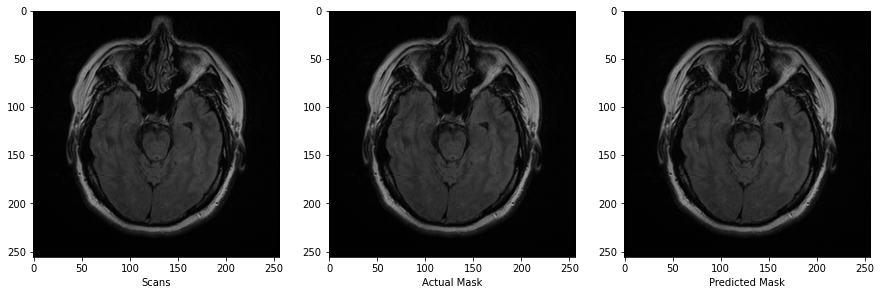

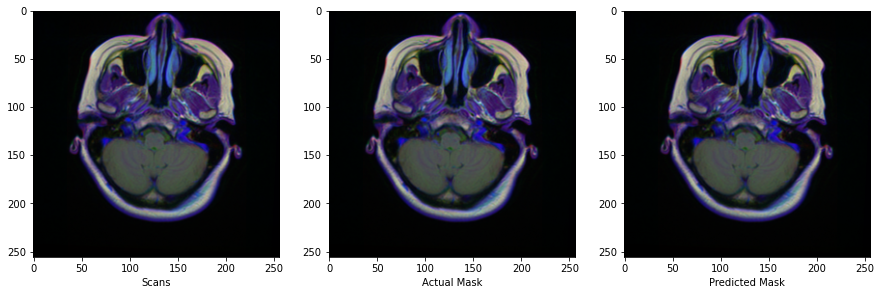

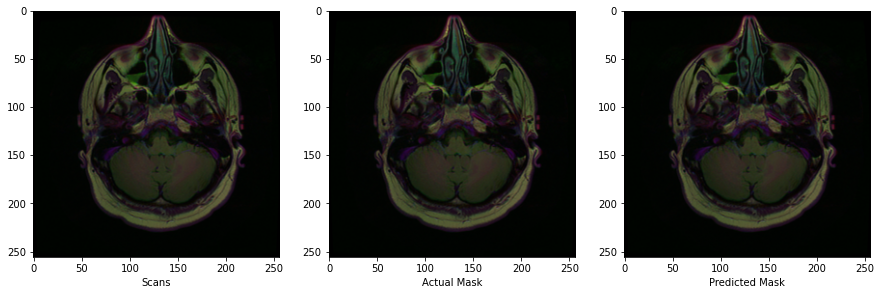

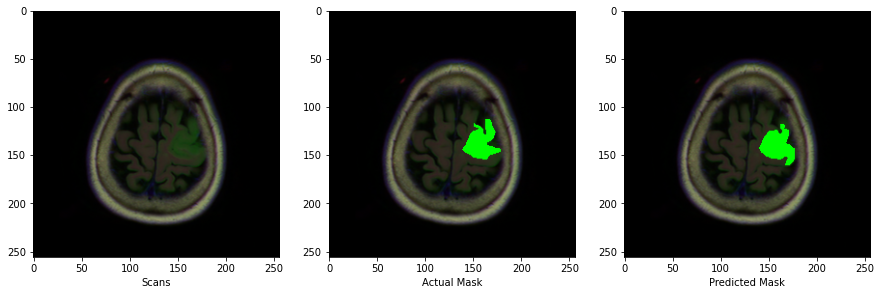

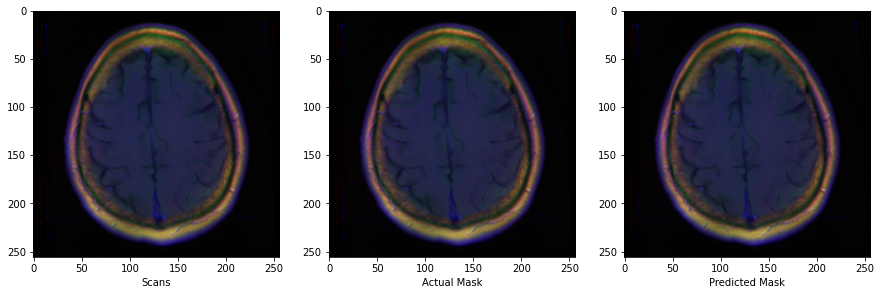

...

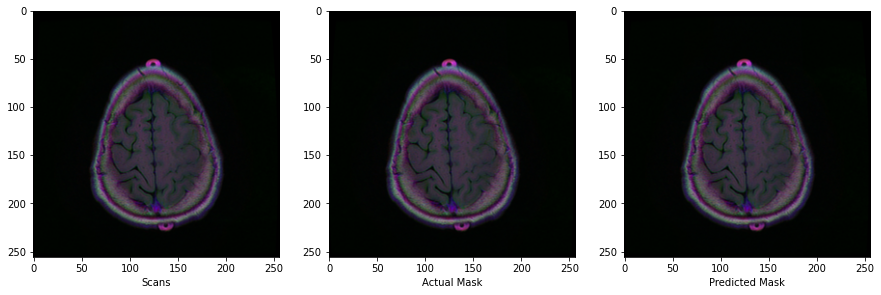

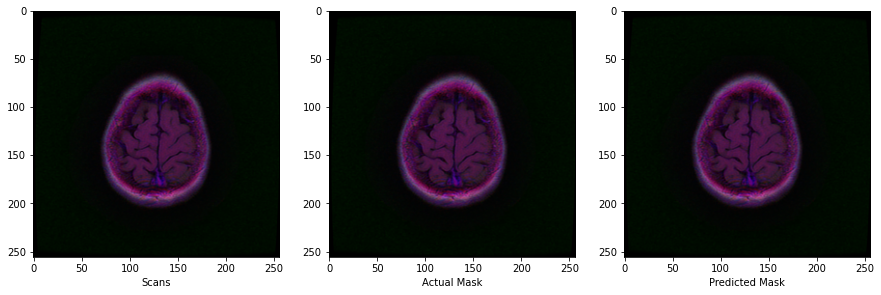

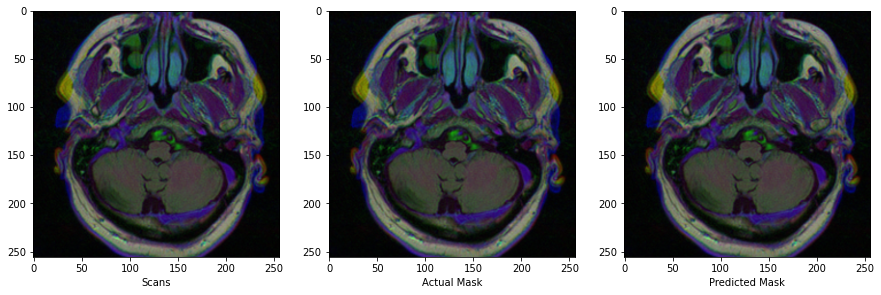

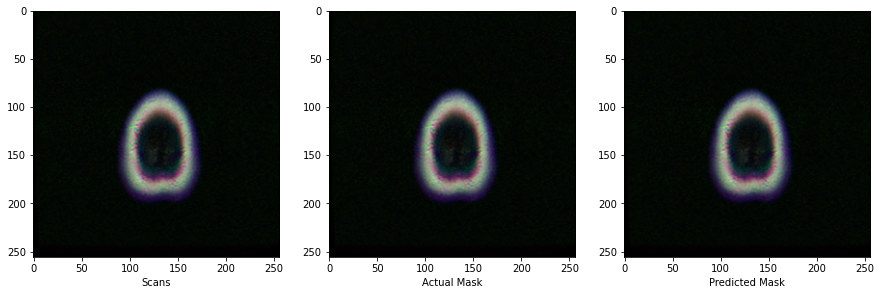

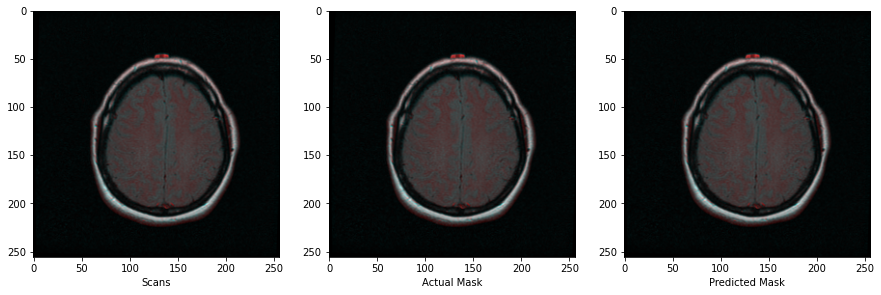

In [ ]:
#https://www.kaggle.com/saivikassingamsetty/mea-unet-cbam-median-14-12
#plotting 50 scans, actual mask and their corresponding predicted mask image
import numpy as np
import cv2 as cv
import cv2
IMG_SIZE=(256,256)
for i in range(50):
    index=np.random.randint(1,len(X_test.index))
    img = cv.imread(X_test['image'].iloc[index])
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    img = cv.resize(img ,IMG_SIZE)
    img = img / 255
    img = img[np.newaxis, :, :, :]
    pred=model.predict(img)
    img = np.squeeze(img)

    original = img.copy()
    fig, ax = plt.subplots(1,3,figsize = (15,5))
    ax[0].imshow(original)
    ax[0].set_xlabel('Scans')
    
    main = original.copy()
    label = cv.imread(X_test['mask'].iloc[index])
    sample = np.array(np.squeeze(label), dtype = np.uint8)
    contours, hier = cv2.findContours(sample[:,:,0],cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)
    sample_over_gt = cv2.drawContours(main, contours, -1,[0,255,0], thickness=-1)
    ax[1].imshow(sample_over_gt)
    ax[1].set_xlabel('Actual Mask')
    
    main = original.copy()
    sample = np.array(np.squeeze(pred) > 0.5, dtype = np.uint8)
    contours, hier = cv2.findContours(sample[:,:,0],cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)
    sample_over_pr = cv2.drawContours(main, contours, -1, [0,255,0], thickness=-1)
    ax[2].imshow(sample_over_pr)
    ax[2].set_xlabel("Predicted Mask")

plt.show()